# Imports

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import datasets

from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import scale
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import precision_score, recall_score, precision_recall_curve,f1_score, fbeta_score, classification_report

from tqdm import tqdm, tqdm_notebook

plt.style.use('ggplot')
%matplotlib inline
np.set_printoptions(suppress=True) # Suppress scientific notation where possible

# Import and Format Data

In [8]:
#This is an optional setting to max all columns visible in outputs.

pd.set_option('display.max_columns', None)

In [10]:
all_seasons_df = pd.read_csv('<file_location>/<file_name>')

#Example: all_seasons_df = pd.read_csv(''/Users/<UserName/Desktop/Coding/Projects/Project3/all_seasons_df.csv')

In [11]:
#Set asside a copy of the dataframe prior to dropping columns.

all_seasons_df_PRE = all_seasons_df

In [12]:
#Check the dataframe.

all_seasons_df_PRE

,SEASON_YEAR,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,WL,MIN,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,TOV,STL,BLK,BLKA,PF,PFD,PTS,PLUS_MINUS,GP_RANK,W_RANK,L_RANK,W_PCT_RANK,MIN_RANK,FGM_RANK,FGA_RANK,FG_PCT_RANK,FG3M_RANK,FG3A_RANK,FG3_PCT_RANK,FTM_RANK,FTA_RANK,FT_PCT_RANK,OREB_RANK,DREB_RANK,REB_RANK,AST_RANK,TOV_RANK,STL_RANK,BLK_RANK,BLKA_RANK,PF_RANK,PFD_RANK,PTS_RANK,PLUS_MINUS_RANK
0,2001-02,1610612765,DET,Detroit Pistons,20101181,2002-04-17T00:00:00,DET vs. MIL,W,24.0,25,46,0.543,8,12,0.667,6,7,0.857,9,18,27,16,8.0,5,1,2,9,0,64,20.0,1,1,1,1,1,71,327,283,8,119,129,1384,1662,529,259,403,172,168,1336,494,1673,707,903,80,50,50
1,2001-02,1610612749,MIL,Milwaukee Bucks,20101181,2002-04-17T00:00:00,MIL @ DET,L,24.0,19,40,0.475,2,6,0.333,4,8,0.500,5,11,16,8,7.0,4,2,1,11,0,44,-20.0,1,1190,1190,1190,1,987,1391,929,995,1160,1136,1903,1445,2170,1322,2044,2077,1963,986,856,1101,218,1555,80,1580,2320
2,2001-02,1610612758,SAC,Sacramento Kings,20101188,2002-04-17T00:00:00,SAC @ LAL,L,24.0,20,39,0.513,2,5,0.400,12,17,0.706,3,21,24,7,8.0,1,2,1,6,0,54,-2.0,1,1190,1190,1190,1,690,1636,515,995,1454,907,259,177,1514,1973,86,525,2144,1336,2146,1101,218,140,80,462,1318
3,2001-02,1610612752,NYK,New York Knicks,20101179,2002-04-17T00:00:00,NYK vs. NJN,L,24.0,18,45,0.400,3,14,0.214,4,4,1.000,9,17,26,9,8.0,2,1,0,11,1,43,4.0,1,1190,1190,1190,1,1280,450,1774,566,42,1781,1903,2153,1,259,602,271,1753,1336,1771,1673,1,1555,1,1723,790
4,2001-02,1610612737,ATL,Atlanta Hawks,20101176,2002-04-17T00:00:00,ATL @ BOS,L,24.0,13,43,0.302,0,3,0.000,13,16,0.813,10,17,27,8,8.0,8,2,4,4,0,39,-10.0,1,1190,1190,1190,1,2267,785,2341,2083,2001,2083,174,243,853,145,602,172,1963,1336,41,1101,1743,19,80,2076,1943
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46273,2020-21,1610612743,DEN,Denver Nuggets,22000019,2020-12-23T00:00:00,DEN vs. SAC,L,24.0,23,45,0.511,5,12,0.417,9,10,0.900,7,21,28,13,8.0,2,4,4,10,11,60,7.0,1,305,305,305,1,140,267,168,372,541,213,198,252,123,82,100,58,241,347,434,69,459,348,108,182,158
46274,2020-21,1610612751,BKN,Brooklyn Nets,22000001,2020-12-22T00:00:00,BKN vs. GSW,W,24.0,23,47,0.489,9,20,0.450,8,9,0.889,4,24,28,11,13.0,5,6,2,10,10,63,18.0,1,1,1,1,1,140,156,219,91,139,156,245,307,137,309,24,58,382,593,134,15,170,348,191,124,44
46275,2020-21,1610612747,LAL,Los Angeles Lakers,22000002,2020-12-22T00:00:00,LAL vs. LAC,L,24.0,17,40,0.425,5,17,0.294,15,20,0.750,3,21,24,10,11.0,3,0,0,12,17,54,-2.0,1,305,305,305,1,512,536,417,372,313,446,23,15,335,427,100,199,459,540,324,564,1,502,3,355,336
46276,2020-21,1610612744,GSW,Golden State Warriors,22000001,2020-12-22T00:00:00,GSW @ BKN,L,24.0,17,53,0.321,4,17,0.235,7,10,0.700,6,17,23,10,9.0,4,2,6,10,10,45,-18.0,1,305,305,305,1,512,14,592,466,313,522,300,252,416,136,311,249,459,420,223,267,584,348,191,541,562


## Convert Data Types

In [13]:
#Replace Wins and Losses ("WL") with 1 and 0, respectively for analysis.

#Conversion data type for 'WL' to integer from 'object' required.

all_seasons_df['WL'].replace(to_replace =["W"], value ="1", inplace=True)
all_seasons_df['WL'].replace(to_replace =["L"], value ="0", inplace=True)
all_seasons_df['WL']=all_seasons_df['WL'].astype('int')
all_seasons_df

,SEASON_YEAR,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,WL,MIN,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,TOV,STL,BLK,BLKA,PF,PFD,PTS,PLUS_MINUS,GP_RANK,W_RANK,L_RANK,W_PCT_RANK,MIN_RANK,FGM_RANK,FGA_RANK,FG_PCT_RANK,FG3M_RANK,FG3A_RANK,FG3_PCT_RANK,FTM_RANK,FTA_RANK,FT_PCT_RANK,OREB_RANK,DREB_RANK,REB_RANK,AST_RANK,TOV_RANK,STL_RANK,BLK_RANK,BLKA_RANK,PF_RANK,PFD_RANK,PTS_RANK,PLUS_MINUS_RANK
0,2001-02,1610612765,DET,Detroit Pistons,20101181,2002-04-17T00:00:00,DET vs. MIL,1,24.0,25,46,0.543,8,12,0.667,6,7,0.857,9,18,27,16,8.0,5,1,2,9,0,64,20.0,1,1,1,1,1,71,327,283,8,119,129,1384,1662,529,259,403,172,168,1336,494,1673,707,903,80,50,50
1,2001-02,1610612749,MIL,Milwaukee Bucks,20101181,2002-04-17T00:00:00,MIL @ DET,0,24.0,19,40,0.475,2,6,0.333,4,8,0.500,5,11,16,8,7.0,4,2,1,11,0,44,-20.0,1,1190,1190,1190,1,987,1391,929,995,1160,1136,1903,1445,2170,1322,2044,2077,1963,986,856,1101,218,1555,80,1580,2320
2,2001-02,1610612758,SAC,Sacramento Kings,20101188,2002-04-17T00:00:00,SAC @ LAL,0,24.0,20,39,0.513,2,5,0.400,12,17,0.706,3,21,24,7,8.0,1,2,1,6,0,54,-2.0,1,1190,1190,1190,1,690,1636,515,995,1454,907,259,177,1514,1973,86,525,2144,1336,2146,1101,218,140,80,462,1318
3,2001-02,1610612752,NYK,New York Knicks,20101179,2002-04-17T00:00:00,NYK vs. NJN,0,24.0,18,45,0.400,3,14,0.214,4,4,1.000,9,17,26,9,8.0,2,1,0,11,1,43,4.0,1,1190,1190,1190,1,1280,450,1774,566,42,1781,1903,2153,1,259,602,271,1753,1336,1771,1673,1,1555,1,1723,790
4,2001-02,1610612737,ATL,Atlanta Hawks,20101176,2002-04-17T00:00:00,ATL @ BOS,0,24.0,13,43,0.302,0,3,0.000,13,16,0.813,10,17,27,8,8.0,8,2,4,4,0,39,-10.0,1,1190,1190,1190,1,2267,785,2341,2083,2001,2083,174,243,853,145,602,172,1963,1336,41,1101,1743,19,80,2076,1943
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46273,2020-21,1610612743,DEN,Denver Nuggets,22000019,2020-12-23T00:00:00,DEN vs. SAC,0,24.0,23,45,0.511,5,12,0.417,9,10,0.900,7,21,28,13,8.0,2,4,4,10,11,60,7.0,1,305,305,305,1,140,267,168,372,541,213,198,252,123,82,100,58,241,347,434,69,459,348,108,182,158
46274,2020-21,1610612751,BKN,Brooklyn Nets,22000001,2020-12-22T00:00:00,BKN vs. GSW,1,24.0,23,47,0.489,9,20,0.450,8,9,0.889,4,24,28,11,13.0,5,6,2,10,10,63,18.0,1,1,1,1,1,140,156,219,91,139,156,245,307,137,309,24,58,382,593,134,15,170,348,191,124,44
46275,2020-21,1610612747,LAL,Los Angeles Lakers,22000002,2020-12-22T00:00:00,LAL vs. LAC,0,24.0,17,40,0.425,5,17,0.294,15,20,0.750,3,21,24,10,11.0,3,0,0,12,17,54,-2.0,1,305,305,305,1,512,536,417,372,313,446,23,15,335,427,100,199,459,540,324,564,1,502,3,355,336
46276,2020-21,1610612744,GSW,Golden State Warriors,22000001,2020-12-22T00:00:00,GSW @ BKN,0,24.0,17,53,0.321,4,17,0.235,7,10,0.700,6,17,23,10,9.0,4,2,6,10,10,45,-18.0,1,305,305,305,1,512,14,592,466,313,522,300,252,416,136,311,249,459,420,223,267,584,348,191,541,562


## Drop Target Column

In [14]:
#Columns to be dropped.
all_seasons_df.drop(all_seasons_df.iloc[:, 30:], inplace = True, axis = 1)
all_seasons_df.drop(['SEASON_YEAR', 'TEAM_ABBREVIATION','TEAM_NAME', 'GAME_DATE',
                     'MATCHUP','TEAM_ID','GAME_ID','MIN'], axis=1, inplace=True)

#Dataframe with the target column 'WL'
all_seasons_df

,WL,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,TOV,STL,BLK,BLKA,PF,PFD,PTS,PLUS_MINUS
0,1,25,46,0.543,8,12,0.667,6,7,0.857,9,18,27,16,8.0,5,1,2,9,0,64,20.0
1,0,19,40,0.475,2,6,0.333,4,8,0.500,5,11,16,8,7.0,4,2,1,11,0,44,-20.0
2,0,20,39,0.513,2,5,0.400,12,17,0.706,3,21,24,7,8.0,1,2,1,6,0,54,-2.0
3,0,18,45,0.400,3,14,0.214,4,4,1.000,9,17,26,9,8.0,2,1,0,11,1,43,4.0
4,0,13,43,0.302,0,3,0.000,13,16,0.813,10,17,27,8,8.0,8,2,4,4,0,39,-10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46273,0,23,45,0.511,5,12,0.417,9,10,0.900,7,21,28,13,8.0,2,4,4,10,11,60,7.0
46274,1,23,47,0.489,9,20,0.450,8,9,0.889,4,24,28,11,13.0,5,6,2,10,10,63,18.0
46275,0,17,40,0.425,5,17,0.294,15,20,0.750,3,21,24,10,11.0,3,0,0,12,17,54,-2.0
46276,0,17,53,0.321,4,17,0.235,7,10,0.700,6,17,23,10,9.0,4,2,6,10,10,45,-18.0


In [15]:
##Dataframe without the target column 'WL'

all_seasons_WL_dropped_df = all_seasons_df.drop('WL', axis=1)
all_seasons_WL_dropped_df

,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,TOV,STL,BLK,BLKA,PF,PFD,PTS,PLUS_MINUS
0,25,46,0.543,8,12,0.667,6,7,0.857,9,18,27,16,8.0,5,1,2,9,0,64,20.0
1,19,40,0.475,2,6,0.333,4,8,0.500,5,11,16,8,7.0,4,2,1,11,0,44,-20.0
2,20,39,0.513,2,5,0.400,12,17,0.706,3,21,24,7,8.0,1,2,1,6,0,54,-2.0
3,18,45,0.400,3,14,0.214,4,4,1.000,9,17,26,9,8.0,2,1,0,11,1,43,4.0
4,13,43,0.302,0,3,0.000,13,16,0.813,10,17,27,8,8.0,8,2,4,4,0,39,-10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46273,23,45,0.511,5,12,0.417,9,10,0.900,7,21,28,13,8.0,2,4,4,10,11,60,7.0
46274,23,47,0.489,9,20,0.450,8,9,0.889,4,24,28,11,13.0,5,6,2,10,10,63,18.0
46275,17,40,0.425,5,17,0.294,15,20,0.750,3,21,24,10,11.0,3,0,0,12,17,54,-2.0
46276,17,53,0.321,4,17,0.235,7,10,0.700,6,17,23,10,9.0,4,2,6,10,10,45,-18.0


In [23]:
# Check to make sure all data is in the right format

print(all_seasons_df.dtypes)
print(all_seasons_WL_dropped_df.dtypes)

WL              int64
FGM             int64
FGA             int64
FG_PCT        float64
FG3M            int64
FG3A            int64
FG3_PCT       float64
FTM             int64
FTA             int64
FT_PCT        float64
OREB            int64
DREB            int64
REB             int64
AST             int64
TOV           float64
STL             int64
BLK             int64
BLKA            int64
PF              int64
PFD             int64
PTS             int64
PLUS_MINUS    float64
dtype: object
FGM             int64
FGA             int64
FG_PCT        float64
FG3M            int64
FG3A            int64
FG3_PCT       float64
FTM             int64
FTA             int64
FT_PCT        float64
OREB            int64
DREB            int64
REB             int64
AST             int64
TOV           float64
STL             int64
BLK             int64
BLKA            int64
PF              int64
PFD             int64
PTS             int64
PLUS_MINUS    float64
dtype: object


## Scaling

* Data must be scaled for kNN and Logistic Regression so we will use the sklearn method "scale()".

In [153]:
#Define a new variable for the dataframe that has the target "WL" dropped
# and is scaled.

all_seasons_WL_dropped_scaled_array = scale(all_seasons_WL_dropped_df)

In [154]:
#Case formatting is important here. 'X' is always uppercase and 'y' is lowercase.
# Any modificaitons to the split or different types of split will use '_info' where
# 'info' is what modification was made.

#Add "_S" for the scaled data (only X).

#Need the scaled one without the 'WL' column for the data and the target is
# Target is found in 'all_seasons_df' dataframe as "WL".

X_train_S, X_test_S, y_train, y_test = train_test_split(all_seasons_WL_dropped_scaled_array, all_seasons_df['WL'], \
                                                            test_size=0.2, random_state=41)

y_test

11504    0
14433    1
756      1
16464    0
34595    0
        ..
45194    0
21332    1
29585    1
13954    1
32594    1
Name: WL, Length: 9256, dtype: int64

In [155]:
#The scaled dataframe 'all_seasons_WL_dropped_scaled_array' is now an array.

type(all_seasons_WL_dropped_scaled_array)

numpy.ndarray

In [161]:
all_seasons_WL_dropped_scaled_df=pd.DataFrame(all_seasons_WL_dropped_scaled_array)

## Heatmap of Scaled Data

<AxesSubplot:>

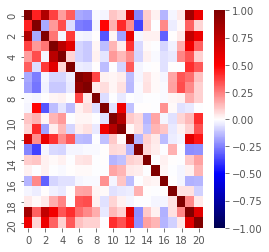

In [158]:
#Heatmap

sns.heatmap(all_seasons_WL_dropped_scaled_df.corr(), cmap="seismic", annot=False, vmin=-1, vmax=1, fmt=".2f")

# kNN

## kNN Initial Model Run

In [ ]:
# First model run, using arbitrary k value.

knn = KNeighborsClassifier(n_neighbors=20)
knn.fit(X_train_S, y_train)
print("The accuracy score for kNN is")
print("Training: {:6.2f}%".format(100*knn.score(X_train_S, y_train)))
print("Test set: {:6.2f}%".format(100*knn.score(X_test, y_test)))

## Find Best 'k' Value

In [ ]:
#Test a range of k-values.

#Looking for best cross-validated accuracy.

k_range = [2,20,100,219,439,2190]
k_scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X_train_S, y_train, cv=10, scoring='accuracy')
    k_scores.append(scores.mean())

plt.figure(dpi=150)
plt.plot(k_range, k_scores)
plt.xlabel('Value of k for kNN')
plt.ylabel('Scaled and Cross-Validated Accuracy')

## Best 'k' Value Model Run

In [ ]:
# k=219 justfication same as above.  k=sqrt(sample_size)

knn = KNeighborsClassifier(n_neighbors=219)
knn.fit(X_train_S, y_train)
print("The accuracy score for scaled kNN is")
print("Training: {:6.2f}%".format(100*knn.score(X_train_S, y_train)))
print("Test set: {:6.2f}%".format(100*knn.score(X_test_S, y_test)))

### Other Metrics

In [39]:
#Using: from sklearn.metrics import classification_report

y_true, y_pred = y_test, knn.predict(X_test_S)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.70      0.72      0.71      4623
           1       0.71      0.69      0.70      4633

    accuracy                           0.70      9256
   macro avg       0.70      0.70      0.70      9256
weighted avg       0.70      0.70      0.70      9256



### Cross Validation

In [37]:
#10-fold cross-validation with k=219 (same as value from above)
knn = KNeighborsClassifier(n_neighbors=219)
knn.fit(X_train_S, y_train)
scores = cross_val_score(knn, X_train_S, y_train, cv=10, scoring='accuracy')
print(scores)

[0.70645423 0.71077505 0.71366829 0.70853593 0.71961102 0.70340357
 0.70556456 0.70880605 0.71880065 0.71123717]


In [35]:
#Use average accuracy as an estimate of out-of-sample accuracy
print(scores.mean())

0.7106856502087098


In [40]:
#Using: from sklearn.metrics import classification_report

y_true, y_pred = y_test, knn.predict(X_test_S)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.70      0.72      0.71      4623
           1       0.71      0.69      0.70      4633

    accuracy                           0.70      9256
   macro avg       0.70      0.70      0.70      9256
weighted avg       0.70      0.70      0.70      9256



### Confusion Matrix

In [48]:
from sklearn.metrics import confusion_matrix

print("kNN confusion matrix: \n\n", confusion_matrix(y_test, knn.predict(X_test_S)))

kNN confusion matrix: 

 [[3316 1307]
 [1451 3182]]


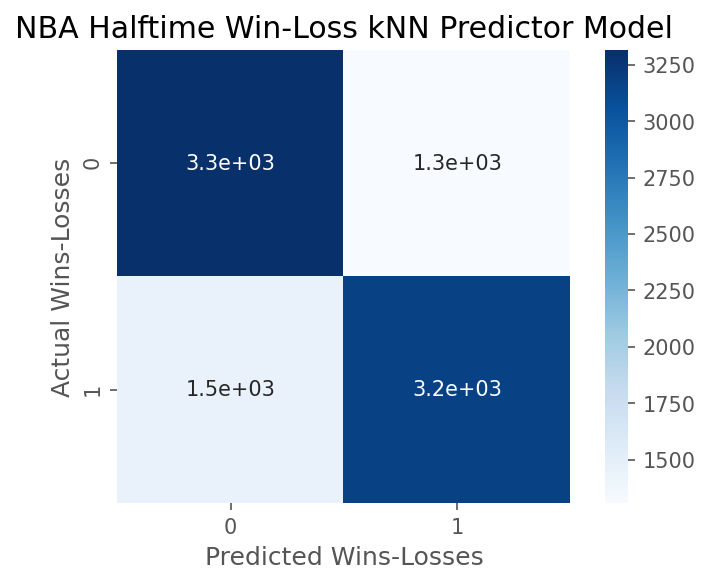

In [49]:
# Print confusion matrix for Logistic Regression

knn_confusion = confusion_matrix(y_test, knn.predict(X_test_S))
plt.figure(dpi=150)
sns.heatmap(knn_confusion, cmap=plt.cm.Blues, annot=True, square=True)

plt.xlabel('Predicted Wins-Losses')
plt.ylabel('Actual Wins-Losses')
plt.title('NBA Halftime Win-Loss kNN Predictor Model');

# Logistic Regression

## Scaled Model Run

In [41]:
logit = LogisticRegression(C = 0.95)
logit.fit(X_train_S, y_train)
print("The accuracy score for the scaled logistic regression is")
print("Training: {:6.2f}%".format(100*logit.score(X_train_S, y_train)))
print("Test set: {:6.2f}%".format(100*logit.score(X_test_S, y_test)))

The accuracy score for the scaled logistic regression is
Training:  72.55%
Test set:  71.63%


### Cross Validation Metrics

In [44]:
# 10-fold cross-validation.

scores = cross_val_score(knn, X_train_S, y_train, cv=10, scoring='accuracy')
print(scores)

[0.70645423 0.71077505 0.71366829 0.70853593 0.71961102 0.70340357
 0.70556456 0.70880605 0.71880065 0.71123717]


In [46]:
# use average accuracy as an estimate of out-of-sample accuracy
print(scores.mean())

0.7106856502087098


### Other Metrics

In [45]:
y_true, y_pred = y_test, logit.predict(X_test_S)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.70      0.72      0.71      4623
           1       0.71      0.69      0.70      4633

    accuracy                           0.70      9256
   macro avg       0.70      0.70      0.70      9256
weighted avg       0.70      0.70      0.70      9256



## Confusion Matrix

In [42]:
from sklearn.metrics import confusion_matrix

print("Logistic Regression confusion matrix: \n\n", confusion_matrix(y_test, logit.predict(X_test_S)))

kNN confusion matrix: 

 [[3316 1307]
 [1451 3182]]


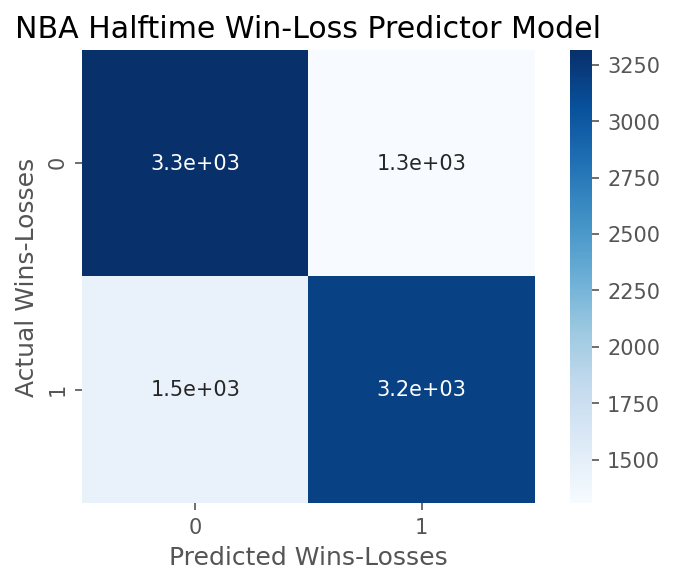

In [43]:
# Print confusion matrix for Logistic Regression

knn_confusion = confusion_matrix(y_test, knn.predict(X_test_S))
plt.figure(dpi=150)
sns.heatmap(knn_confusion, cmap=plt.cm.Blues, annot=True, square=True)

plt.xlabel('Predicted Wins-Losses')
plt.ylabel('Actual Wins-Losses')
plt.title('NBA Halftime Win-Loss Logistic Regression Model');

## Polynomial Transformation

In [168]:
# All features.

p = PolynomialFeatures(degree=2,interaction_only=True)
p.fit(X_train_S)
x_train_poly = p.transform(X_train_S)

logit.fit(x_train_poly,y_train)
logit.score(x_train_poly,y_train)
print('Training R^2 score: ', logit.score(x_train_poly,y_train))
print('Training coef: ', logit.coef_)

Training R^2 score:  0.7280806007238939
Training coef:  [[ 0.01339818 -0.04815738 -0.00346147 -0.01667881 -0.00109806  0.08256502
  -0.08536214  0.0209614   0.03649712 -0.01852475  0.03101874 -0.03934959
  -0.01372911  0.1026917  -0.02493712  0.00040236  0.07146757 -0.07455075
  -0.06728006  0.01940905 -0.03102878  1.53109943 -0.04335482 -0.07522556
  -0.18030756  0.01001669 -0.25730225  0.07098836 -0.16754077  0.07203742
  -0.12506933  0.0967631   0.00394291  0.18549804  0.15947065  0.15964731
   0.09674023  0.1227507   0.14148131  0.04807767  0.07811959  0.02880599
  -0.0127844   0.11262696 -0.03351476  0.28270056  0.04817457  0.03353857
  -0.09480528  0.13507331 -0.0964156   0.00245934 -0.20568615 -0.15485201
  -0.18579527 -0.08730857 -0.0936482  -0.15575855 -0.03797008  0.01688586
   0.04391831  0.15748913  0.00807554  0.40888326  0.02287208  0.10918614
  -0.07784151  0.16117343 -0.15636728 -0.03138848 -0.25301112 -0.21232825
  -0.20163938 -0.13674476 -0.17927868 -0.17187932 -0.001

/Users/johnmetzger/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [169]:
x_val_poly_test = p.transform(X_test_S)
logit.score(x_val_poly_test, y_test)

0.7117545375972342

### Cross-Validation

In [170]:
# 5-fold cross-validation.

scores = cross_val_score(logit, x_train_poly, y_train, cv=5, scoring='accuracy')
print(scores)

/Users/johnmetzger/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/johnmetzger/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

[0.72140446 0.72478055 0.72069152 0.72163695 0.72757969]


/Users/johnmetzger/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


### Other Metrics

In [171]:
y_true, y_pred = y_test, logit.predict(x_val_poly_test)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.71      0.72      0.71      4623
           1       0.72      0.70      0.71      4633

    accuracy                           0.71      9256
   macro avg       0.71      0.71      0.71      9256
weighted avg       0.71      0.71      0.71      9256



### ROAUC Curve

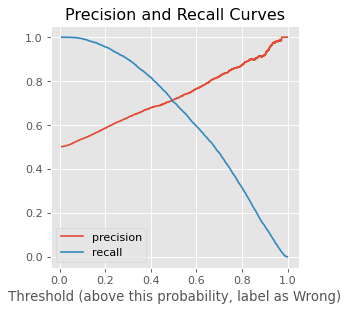

In [172]:
#Let's use probabilities to make a curve showing us how recall 
# and thresholds trade off 

precision_curve, recall_curve, threshold_curve = precision_recall_curve(y_test, logit.predict_proba(x_val_poly_test)[:,1] )

plt.figure(dpi=80)
plt.plot(threshold_curve, precision_curve[1:],label='precision')
plt.plot(threshold_curve, recall_curve[1:], label='recall')
plt.legend(loc='lower left')
plt.xlabel('Threshold (above this probability, label as Wrong)');
plt.title('Precision and Recall Curves');

* The intersection above is the threshold value of where precision and recall are balanced.

* Chose the threshold per use case.  

* Think about if i want to weigh precision or recall more for my use case.

In [173]:
fpr, tpr, thresholds = roc_curve(y_test, logit.predict_proba(x_val_poly_test)[:,1])

In [174]:
taste = fpr, tpr, thresholds

ROC AUC score =  0.7988767486808864


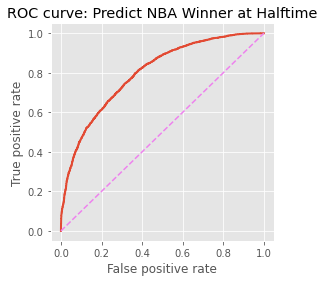

In [175]:
#ROAUC Curve Figure

plt.plot(fpr, tpr,lw=2)
plt.plot([0,1],[0,1],c='violet',ls='--')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])
plt.rcParams["figure.figsize"] = (4,4)
plt.savefig('test2png', dpi=300, format='pdf')

plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve: Predict NBA Winner at Halftime');
print("ROC AUC score = ", roc_auc_score(y_test, logit.predict_proba(x_val_poly_test)[:,1]))

# Pairplot

* The 21-feature pairplot will take a long time.  Timed at 20.5m previously.

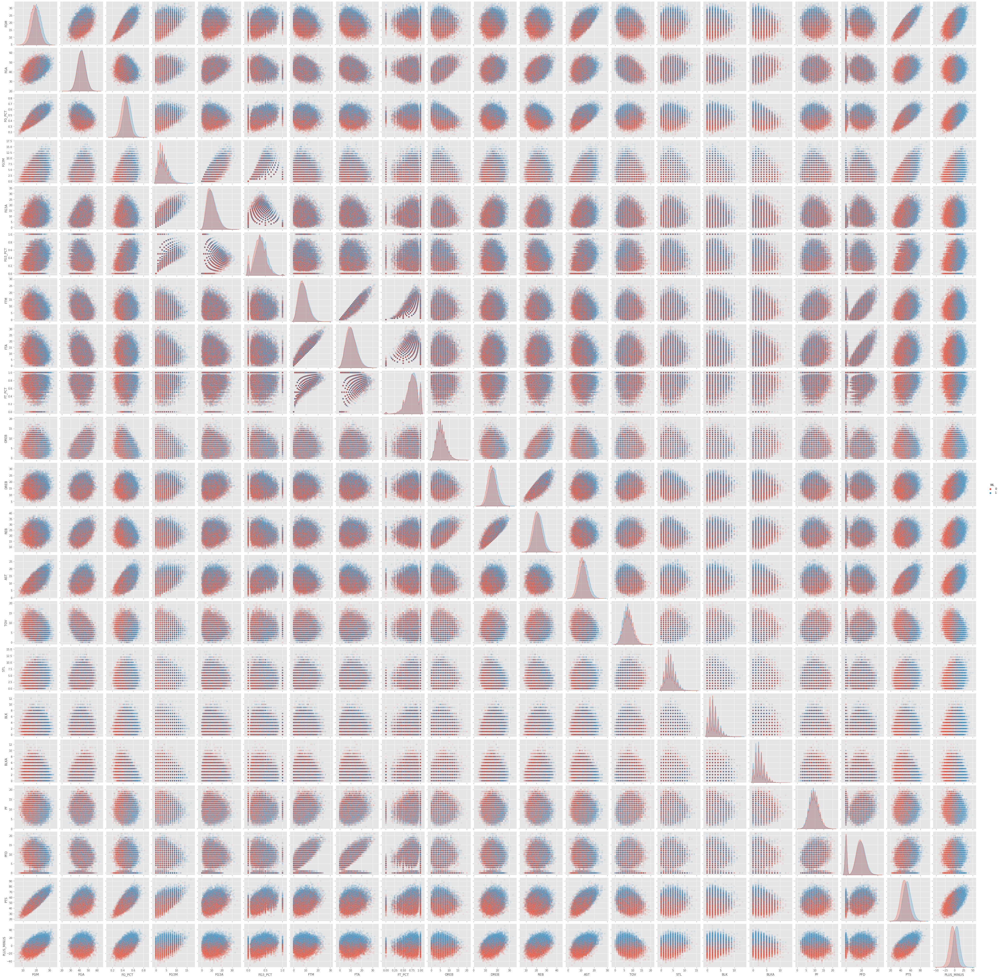

In [47]:
pairplot_21_features = sns.pairplot(all_seasons_df, hue='WL', plot_kws={'alpha':0.1})

In [48]:
#Save figure.  Note that there is an sns bug where some figure types take
# '.fig' and some take '.figure' to save.

pairplot_21_features.fig.savefig("pairplot_21_features.png", format="png", dpi=300)

## 2 Feature Pairplot

In [213]:
pairplot_2_features_df = all_seasons_df[['WL','PTS','PLUS_MINUS']]

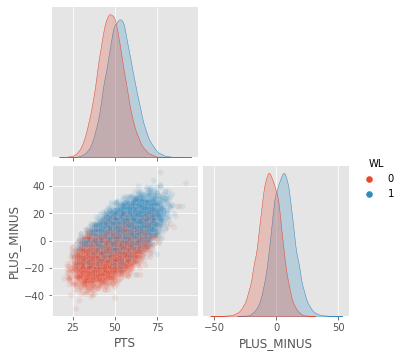

In [216]:
pairplot_2_features = sns.pairplot(data=pairplot_2_features_df, hue='WL', plot_kws={'alpha':0.1}, corner=True, diag_kws=dict(fill=True))

In [266]:
pairplot_2_features.fig.savefig("doot6.pdf", format="pdf", dpi=300)

## Single Feature Histogram

In [ ]:
histplot_1_feature = sns.histplot(data=all_seasons_df, x="PLUS_MINUS", alpha=0.5, hue='WL', element="step")

In [ ]:
histplot_1_feature.figure.savefig("PLUS_MINUS", format="pdf")

## Isolating features

In [ ]:
List of features that may help predict winner:
* "PTS"
* "PLUS_MINUS"
* "PG_PCT"
* "STL"
* "BLK"
* "PF"

# Isolating 6 features

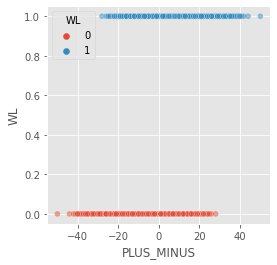

In [268]:
Sandy = sns.scatterplot(data=all_seasons_df, x="PLUS_MINUS", y='WL',alpha=0.5, hue='WL')

In [64]:
dave.figure.savefig("DREB_FGPCT.png", format="png", dpi=300)

In [123]:
all_seasons_df

,WL,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,TOV,STL,BLK,BLKA,PF,PFD,PTS,PLUS_MINUS
0,1,25,46,0.543,8,12,0.667,6,7,0.857,9,18,27,16,8.0,5,1,2,9,0,64,20.0
1,0,19,40,0.475,2,6,0.333,4,8,0.500,5,11,16,8,7.0,4,2,1,11,0,44,-20.0
2,0,20,39,0.513,2,5,0.400,12,17,0.706,3,21,24,7,8.0,1,2,1,6,0,54,-2.0
3,0,18,45,0.400,3,14,0.214,4,4,1.000,9,17,26,9,8.0,2,1,0,11,1,43,4.0
4,0,13,43,0.302,0,3,0.000,13,16,0.813,10,17,27,8,8.0,8,2,4,4,0,39,-10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46273,0,23,45,0.511,5,12,0.417,9,10,0.900,7,21,28,13,8.0,2,4,4,10,11,60,7.0
46274,1,23,47,0.489,9,20,0.450,8,9,0.889,4,24,28,11,13.0,5,6,2,10,10,63,18.0
46275,0,17,40,0.425,5,17,0.294,15,20,0.750,3,21,24,10,11.0,3,0,0,12,17,54,-2.0
46276,0,17,53,0.321,4,17,0.235,7,10,0.700,6,17,23,10,9.0,4,2,6,10,10,45,-18.0


In [25]:
all_seasons_df.dtypes

WL              int64
FGM             int64
FGA             int64
FG_PCT        float64
FG3M            int64
FG3A            int64
FG3_PCT       float64
FTM             int64
FTA             int64
FT_PCT        float64
OREB            int64
DREB            int64
REB             int64
AST             int64
TOV           float64
STL             int64
BLK             int64
BLKA            int64
PF              int64
PFD             int64
PTS             int64
PLUS_MINUS    float64
dtype: object

In [64]:
all_seasons_df

,WL,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,TOV,STL,BLK,BLKA,PF,PFD,PTS,PLUS_MINUS
0,1,25,46,0.543,8,12,0.667,6,7,0.857,9,18,27,16,8.0,5,1,2,9,0,64,20.0
1,0,19,40,0.475,2,6,0.333,4,8,0.500,5,11,16,8,7.0,4,2,1,11,0,44,-20.0
2,0,20,39,0.513,2,5,0.400,12,17,0.706,3,21,24,7,8.0,1,2,1,6,0,54,-2.0
3,0,18,45,0.400,3,14,0.214,4,4,1.000,9,17,26,9,8.0,2,1,0,11,1,43,4.0
4,0,13,43,0.302,0,3,0.000,13,16,0.813,10,17,27,8,8.0,8,2,4,4,0,39,-10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46273,0,23,45,0.511,5,12,0.417,9,10,0.900,7,21,28,13,8.0,2,4,4,10,11,60,7.0
46274,1,23,47,0.489,9,20,0.450,8,9,0.889,4,24,28,11,13.0,5,6,2,10,10,63,18.0
46275,0,17,40,0.425,5,17,0.294,15,20,0.750,3,21,24,10,11.0,3,0,0,12,17,54,-2.0
46276,0,17,53,0.321,4,17,0.235,7,10,0.700,6,17,23,10,9.0,4,2,6,10,10,45,-18.0


In [65]:
all_seasons_df.to_csv('all_seasons_df', index=False)

# Logistic feature engineering

## 6 Feature Model

Features chosen
* "PTS"
* "PLUS_MINUS"
* "FG_PCT"
* "STL"
* "BLK"
* "PF"

### Feature Selection

In [61]:
#Dataframe for 6 features.

all_seasons_df_6S = scale(all_seasons_df[['PTS','PLUS_MINUS','FG_PCT','STL','BLK','PF']])

### Train-Test Split

In [132]:
#Train-Test splits for 6-feature feature engineering.

#NOTE: the '_sub6'.  This naming scheme is used for the subsequent models as well.

X_train_sub6, X_test_sub6, y_train_sub6, y_test_sub6 = train_test_split(all_seasons_df_6S, all_seasons_df['WL'], \
                                                            test_size=0.2, random_state=41)
y_test

11504    0
14433    1
756      1
16464    0
34595    0
        ..
45194    0
21332    1
29585    1
13954    1
32594    1
Name: WL, Length: 9256, dtype: int64

### Model Run

In [135]:
logit = LogisticRegression(C = 0.95)
logit.fit(X_train_sub6, y_train_sub6)
print("The accuracy score for logistic regression is")
print("Training: {:6.2f}%".format(100*logit.score(X_train_sub6, y_train_sub6)))
print("Test set: {:6.2f}%".format(100*logit.score(X_test_sub6, y_test_sub6)))

The accuracy score for logistic regression is
Training:  72.47%
Test set:  71.54%


### Other Metrics

In [136]:
#10-fold cross-validation.

scores = cross_val_score(logit, X_train_sub6, y_train, cv=10, scoring='accuracy')
print(scores)

[0.71860654 0.72805833 0.72744462 0.72555375 0.72042139 0.72123177
 0.71799028 0.726094   0.74122096 0.72177202]


### Polynomial Transformation

In [137]:
p = PolynomialFeatures(degree=2,interaction_only=True)
p.fit(X_train_sub6)
x_train_poly6 = p.transform(X_train_sub6)

logit.fit(x_train_poly6,y_train)
logit.score(x_train_poly6,y_train)
print('Training R^2 score: ', logit.score(x_train_poly6,y_train))
print('Training coef: ', logit.coef_)

Training R^2 score:  0.7248933066825131
Training coef:  [[ 0.00230488  0.04734534  1.47979948 -0.05088683  0.00764675  0.06447871
  -0.06939001 -0.01781332  0.00232435 -0.02203564  0.02719097 -0.02034623
  -0.01189863  0.02355435  0.0159717  -0.00586919  0.02558888 -0.03034865
   0.02441081 -0.02348679  0.0100382  -0.01318938]]


In [138]:
x_val_poly_test6 = p.transform(X_test_sub6)
logit.score(x_val_poly_test6, y_test)

0.7159680207433017

#### Cross-Validation

In [139]:
# 10-fold cross-validation.

scores = cross_val_score(logit, x_train_poly6, y_train, cv=10, scoring='accuracy')
print(scores)

[0.72130705 0.72670807 0.72636413 0.72474338 0.71880065 0.72231226
 0.71745003 0.72636413 0.74041059 0.72231226]


In [140]:
# use average accuracy as an estimate of out-of-sample accuracy
print(scores.mean())

0.7246772551290419


#### Other Metrics

In [141]:
y_true, y_pred = y_test, logit.predict(x_val_poly_test6)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.72      0.72      0.72      4623
           1       0.72      0.71      0.72      4633

    accuracy                           0.72      9256
   macro avg       0.72      0.72      0.72      9256
weighted avg       0.72      0.72      0.72      9256



#### ROAUC Curve

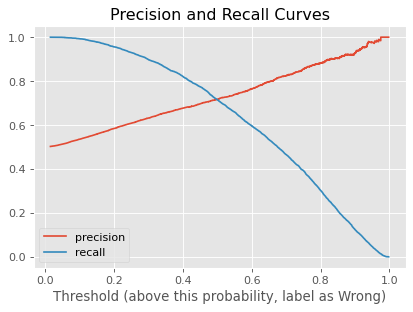

In [142]:
#Let's use probabilities to make a curve showing us how recall 
# and thresholds trade off 

precision_curve, recall_curve, threshold_curve = precision_recall_curve(y_test, logit.predict_proba(x_val_poly_test6)[:,1] )

plt.figure(dpi=80)
plt.plot(threshold_curve, precision_curve[1:],label='precision')
plt.plot(threshold_curve, recall_curve[1:], label='recall')
plt.legend(loc='lower left')
plt.xlabel('Threshold (above this probability, label as Wrong)');
plt.title('Precision and Recall Curves');

* The intersection above is the threshold value of where precision and recall are balanced.

* Chose the threshold per use case.  

* Think about if i want to weigh precision or recall more for my use case.

In [144]:
fpr, tpr, thresholds = roc_curve(y_test, logit.predict_proba(x_val_poly_test6)[:,1])

In [145]:
taste = fpr, tpr, thresholds

ROC AUC score =  0.7999138962980311


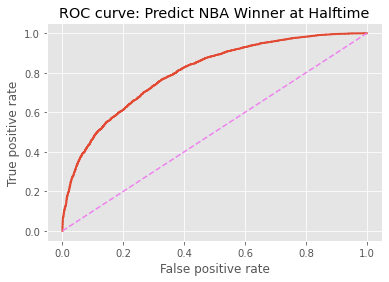

In [146]:
#ROAUC Curve Figure

plt.plot(fpr, tpr,lw=2)
plt.plot([0,1],[0,1],c='violet',ls='--')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])
plt.rcParams["figure.figsize"] = (4,4)
plt.savefig('test2png', dpi=300, format='pdf')

plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve: Predict NBA Winner at Halftime');
print("ROC AUC score = ", roc_auc_score(y_test, logit.predict_proba(x_val_poly_test6)[:,1]))

## 2 Feature Model

### Feature Selection

In [97]:
all_seasons_df_2S = scale(all_seasons_df[['PTS','PLUS_MINUS']])

### Train-Test Split

In [112]:
# Splits for feature engineering

X_train_sub2, X_test_sub2, y_train_sub2, y_test_sub2 = train_test_split(all_seasons_df_2S, all_seasons_df['WL'], \
                                                            test_size=0.2, random_state=41)
y_test

11504    0
14433    1
756      1
16464    0
34595    0
        ..
45194    0
21332    1
29585    1
13954    1
32594    1
Name: WL, Length: 9256, dtype: int64

### Model Run

In [99]:
logit = LogisticRegression(C = 0.95)
logit.fit(X_train_sub2, y_train_sub2)
print("The score for logistic regression is")
print("Training: {:6.2f}%".format(100*logit.score(X_train_sub2, y_train_sub2)))
print("Test set: {:6.2f}%".format(100*logit.score(X_test_sub2, y_test_sub2)))

The score for logistic regression is
Training:  72.41%
Test set:  71.38%


### Polynomial Transformation

In [100]:
p = PolynomialFeatures(degree=2,interaction_only=True)
p.fit(X_train_sub2)
x_train_poly2 = p.transform(X_train_sub2)

logit.fit(x_train_poly2,y_train)
logit.score(x_train_poly2,y_train)
print('Training R^2 score: ', logit.score(x_train_poly2,y_train))
print('Training coef: ', logit.coef_)

Training R^2 score:  0.7238128680244179
Training coef:  [[ 0.00192043 -0.00401746  1.49500232 -0.02037686]]


In [101]:
x_poly_test2 = p.transform(X_test_sub2)
logit.score(x_poly_test2, y_test_sub2)

0.7151037165082109

#### Cross-Validation

In [102]:
# 10-fold cross-validation.

scores = cross_val_score(logit, x_train_poly2, y_train, cv=10, scoring='accuracy')
print(scores)

[0.71698623 0.72589792 0.72555375 0.728255   0.72069152 0.72096164
 0.71636953 0.72393301 0.73824959 0.7193409 ]


In [103]:
# use average accuracy as an estimate of out-of-sample accuracy
print(scores.mean())

0.7236239091262023


#### Other Metrics

In [106]:
y_true, y_pred = y_test, logit.predict(x_poly_test2)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.72      0.70      0.71      4623
           1       0.71      0.73      0.72      4633

    accuracy                           0.72      9256
   macro avg       0.72      0.72      0.72      9256
weighted avg       0.72      0.72      0.72      9256



### ROAUC with 2 features

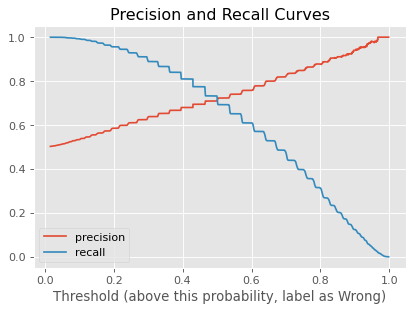

In [192]:
#Let's use probabilities to make a curve showing us how recall 
# and thresholds trade off 

precision_curve, recall_curve, threshold_curve = precision_recall_curve(y_test, logit.predict_proba(x_poly_test2)[:,1] )

plt.figure(dpi=80)
plt.plot(threshold_curve, precision_curve[1:],label='precision')
plt.plot(threshold_curve, recall_curve[1:], label='recall')
plt.legend(loc='lower left')
plt.xlabel('Threshold (above this probability, label as Wrong)');
plt.title('Precision and Recall Curves');

* The intersection above is the threshold value of where precision and recall are balanced.

* Chose the threshold per use case.  

* Think about if i want to weigh precision or recall more for my use case.

In [193]:
fpr, tpr, thresholds = roc_curve(y_test, logit.predict_proba(x_poly_test2)[:,1])

In [238]:
taste = fpr, tpr, thresholds

ROC AUC score =  0.7988923894683062


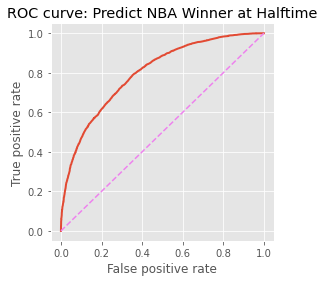

In [257]:
#ROAUC Curve Figure

plt.plot(fpr, tpr,lw=2)
plt.plot([0,1],[0,1],c='violet',ls='--')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])
plt.rcParams["figure.figsize"] = (4,4)
plt.savefig('test2png', dpi=300, format='pdf')

plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve: Predict NBA Winner at Halftime');
print("ROC AUC score = ", roc_auc_score(y_test, logit.predict_proba(x_poly_test2)[:,1]))

## 1 Feature Model

### Feature Selection

* 'PLUS_MINUS' was chosen for it's separable Win and Loss distributions.

In [110]:
all_seasons_df_1S = scale(all_seasons_df[['PLUS_MINUS']])

### Train-Test Split

In [111]:
# Splits for feature engineering

X_train_sub1, X_test_sub1, y_train_sub1, y_test_sub1 = train_test_split(all_seasons_df_1S, all_seasons_df['WL'], \
                                                            test_size=0.2, random_state=41)
y_test

11504    0
14433    1
756      1
16464    0
34595    0
        ..
45194    0
21332    1
29585    1
13954    1
32594    1
Name: WL, Length: 9256, dtype: int64

### Model Run

In [170]:
logit = LogisticRegression(C = 0.95)
logit.fit(X_train_sub1, y_train_sub1)
print("The score for logistic regression is")
print("Training: {:6.2f}%".format(100*logit.score(X_train_sub1, y_train_sub1)))
print("Test set: {:6.2f}%".format(100*logit.score(X_test_sub1, y_test_sub1)))

The score for logistic regression is
Training:  72.43%
Test set:  71.32%


### Polynomial Transformation

In [119]:
p = PolynomialFeatures(degree=2,interaction_only=True)
p.fit(X_train_sub1)
x_train_poly1 = p.transform(X_train_sub1)

logit.fit(x_train_poly1,y_train)
logit.score(x_train_poly1,y_train)
print('Training R^2 score: ', logit.score(x_train_poly1,y_train))
print('Training coef: ', logit.coef_)

Training R^2 score:  0.7242990654205608
Training coef:  [[-0.00133146  1.49160989]]


In [122]:
x_val_poly_test1 = p.transform(X_test_sub1)
logit.score(x_val_poly_test1, y_test_sub1)

0.7131590319792567

#### Cross-Validation

In [123]:
# 10-fold cross-validation.

scores = cross_val_score(logit, x_train_poly2, y_train, cv=10, scoring='accuracy')
print(scores)

[0.71698623 0.72589792 0.72555375 0.728255   0.72069152 0.72096164
 0.71636953 0.72393301 0.73824959 0.7193409 ]


In [124]:
# use average accuracy as an estimate of out-of-sample accuracy
print(scores.mean())

0.7236239091262023


#### Other Metrics

In [125]:
y_true, y_pred = y_test, logit.predict(x_val_poly_test1)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.70      0.73      0.72      4623
           1       0.72      0.69      0.71      4633

    accuracy                           0.71      9256
   macro avg       0.71      0.71      0.71      9256
weighted avg       0.71      0.71      0.71      9256



### ROAUC Curve

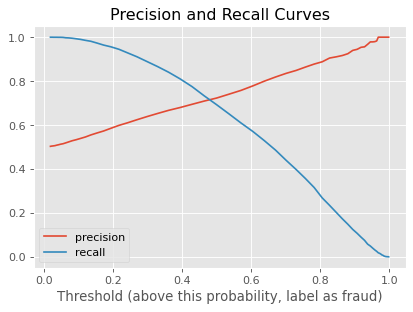

In [127]:
#Let's use probabilities to make a curve showing us how recall 
# and thresholds trade off.

precision_curve, recall_curve, threshold_curve = precision_recall_curve(y_test, logit.predict_proba(x_val_poly_test1)[:,1] )

plt.figure(dpi=80)
plt.plot(threshold_curve, precision_curve[1:],label='precision')
plt.plot(threshold_curve, recall_curve[1:], label='recall')
plt.legend(loc='lower left')
plt.xlabel('Threshold (above this probability, label as fraud)');
plt.title('Precision and Recall Curves');

* The intersection above is the threshold value of where precision and recall are balanced.

* Chose the threshold per use case.  

* Think about if i want to weigh precision or recall more for my use case.

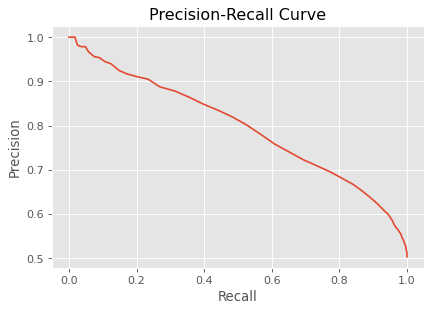

In [128]:
plt.figure(dpi=80)
plt.plot(recall_curve[1:], precision_curve[1:],label='precision')
plt.xlabel("Recall")
plt.ylabel("Precision")* The intersection above is the threshold value of where precision and recall are balanced.

* Chose the threshold per use case.  

* Think about if i want to weigh precision or recall more for my use case.
plt.title("Precision-Recall Curve");

In [129]:
from sklearn.metrics import roc_auc_score, roc_curve

fpr, tpr, thresholds = roc_curve(y_test, logit.predict_proba(x_val_poly_test1)[:,1])

ROC AUC score =  0.7989413894874019


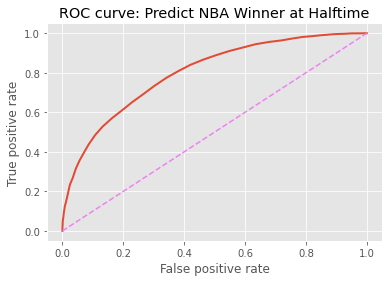

In [130]:
plt.plot(fpr, tpr,lw=2)
plt.plot([0,1],[0,1],c='violet',ls='--')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])


plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve: Predict NBA Winner at Halftime');
print("ROC AUC score = ", roc_auc_score(y_test, logit.predict_proba(x_val_poly_test1)[:,1]))